# **Foundation of the project**

Check the bucket we have created in AWS S3.

In [2]:
!aws s3 ls

/bin/bash: aws: command not found


Check the data(object) we have uploaded to the S3 bucket called project-350-group5

In [ ]:
!aws s3 ls project-350-group5

2021-11-16 20:46:28    1419374 angry-Zhouyi-Glasses.jpg
2021-11-16 20:46:29    1268756 angry-Zhouyi-Mask.jpg
2021-11-16 20:46:30    1424722 angry-Zhouyi-Origin.jpg
2021-11-16 20:46:58    1343524 angry-evelyn-glasses.JPG
2021-11-16 20:46:22    1489337 angry-evelyn-mask.JPG
2021-11-16 20:46:22    1418757 angry-evelyn-origin.JPG
2021-11-16 20:46:23    2048655 angry-matt-glasses.jpg
2021-11-16 20:46:24    2183961 angry-matt-mask.jpg
2021-11-16 20:46:25    2011025 angry-matt-origin.jpg
2021-11-16 20:46:25    2394939 angry-yuki-glasses.JPG
2021-11-16 20:46:26    2363541 angry-yuki-mask.JPG
2021-11-16 20:46:27    2351640 angry-yuki-origin.JPG
2021-11-16 20:46:40    1223069 happy-Zhouyi-Glasses.jpg
2021-11-16 20:46:40    1219790 happy-Zhouyi-Mask.jpg
2021-11-16 20:46:41    1345572 happy-Zhouyi-Origin.jpg
2021-11-16 20:46:31    1307976 happy-evelyn-glasses.JPG
2021-11-16 20:46:31    1514593 happy-evelyn-mask.JPG
2021-11-16 20:46:32    1402556 happy-evelyn-origin.JPG
2021-11-16 20:46:34    18501

In [ ]:
import s3fs
fs = s3fs.S3FileSystem()

In [ ]:
file = fs.open('s3://project-350-group5/angry-Zhouyi-Glasses.jpg')

In [ ]:
from PIL import Image

Check the object status by displaying the image, and check the image it shows with its name.

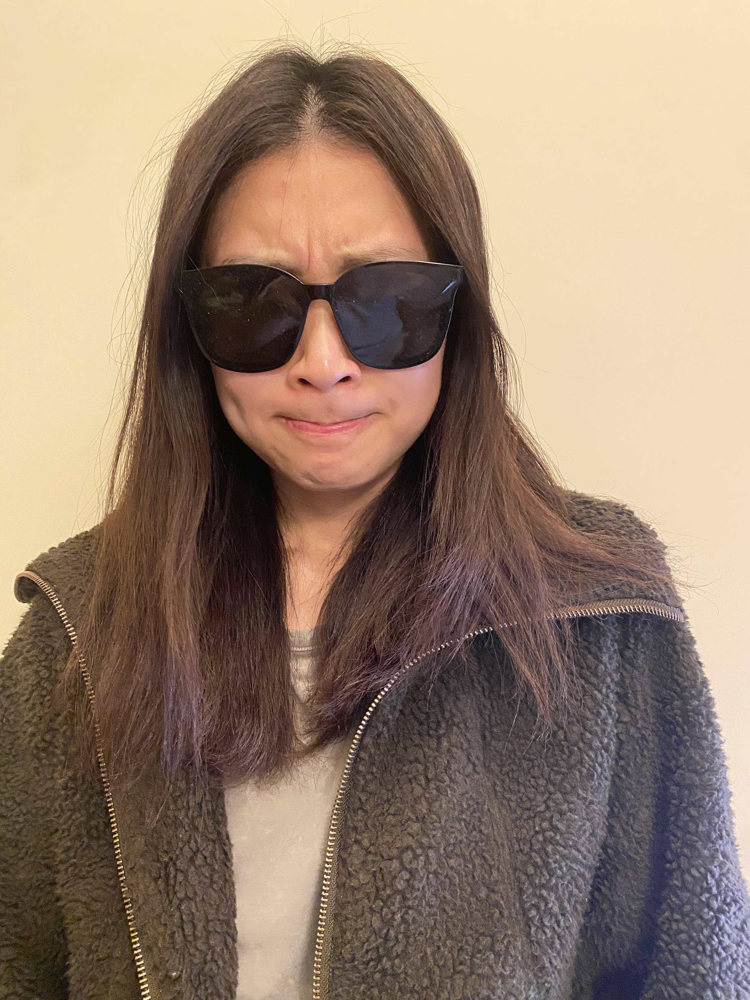

In [ ]:
image = Image.open(file)
display(image)

In [ ]:
import boto3
import numpy as np
import json
import scipy.stats as stats

Create an instance for boto3 client and name it as client, so we can communicate with AWS Rekognition.

In [ ]:
client = boto3.client('rekognition')

By taking a look at the output presented by the AWS Rekognition, we have a basic understanding of its role and decide to explore its accuracy about the output of emotion for a given picture.

In [ ]:
def detect_faces(photo, bucket):
    client=boto3.client('rekognition')
    response = client.detect_faces(Image={'S3Object':{'Bucket':bucket,'Name':photo}},Attributes=['ALL'])  
    return response['FaceDetails']

def main():
    photo='photo'
    bucket='bucket'
    face_count=detect_faces(photo, bucket)
    print("Faces detected: " + str(face_count))

In [ ]:
output = detect_faces("happy-Zhouyi-Glasses.jpg","project-350-group5")

In [ ]:
output

[{'BoundingBox': {'Width': 0.31606343388557434,
   'Height': 0.3418125808238983,
   'Left': 0.24458451569080353,
   'Top': 0.18129439651966095},
  'AgeRange': {'Low': 22, 'High': 34},
  'Smile': {'Value': True, 'Confidence': 99.63119506835938},
  'Eyeglasses': {'Value': True, 'Confidence': 99.74189758300781},
  'Sunglasses': {'Value': True, 'Confidence': 99.23739624023438},
  'Gender': {'Value': 'Female', 'Confidence': 99.9999771118164},
  'Beard': {'Value': False, 'Confidence': 99.99546813964844},
  'Mustache': {'Value': False, 'Confidence': 99.993896484375},
  'EyesOpen': {'Value': True, 'Confidence': 99.99999237060547},
  'MouthOpen': {'Value': True, 'Confidence': 98.74099731445312},
  'Emotions': [{'Type': 'HAPPY', 'Confidence': 99.09651184082031},
   {'Type': 'CONFUSED', 'Confidence': 0.37048664689064026},
   {'Type': 'DISGUSTED', 'Confidence': 0.28837746381759644},
   {'Type': 'FEAR', 'Confidence': 0.08815494179725647},
   {'Type': 'SURPRISED', 'Confidence': 0.07289350777864456},

We also write the function to give out confidence score of each emotion for the chosen picture.

In [29]:
def angry_score(output):
    for emotion in output[0]['Emotions']:
        if emotion['Type']=='ANGRY':
            return emotion['Confidence']    

In [30]:
def happy_score(output):
    for emotion in output[0]['Emotions']:
        if emotion['Type']=='HAPPY':
            return emotion['Confidence']  

In [31]:
def sad_score(output):
    for emotion in output[0]['Emotions']:
        if emotion['Type']=='SAD':
            return emotion['Confidence']  

In [42]:
def surprised_score(output):
    for emotion in output[0]['Emotions']:
        if emotion['Type']=='SURPRISED':
            return emotion['Confidence']  

# **Make the dataframe with our data**

In [33]:
s3_resource = boto3.resource('s3')
my_bucket = s3_resource.Bucket('project-350-group5')
summaries = my_bucket.objects.all()
image_names = [image.key for image  in summaries]
image_names

['angry-Zhouyi-Glasses.jpg',
 'angry-Zhouyi-Mask.jpg',
 'angry-Zhouyi-Origin.jpg',
 'angry-evelyn-glasses.JPG',
 'angry-evelyn-mask.JPG',
 'angry-evelyn-origin.JPG',
 'angry-matt-glasses.jpg',
 'angry-matt-mask.jpg',
 'angry-matt-origin.jpg',
 'angry-yuki-glasses.JPG',
 'angry-yuki-mask.JPG',
 'angry-yuki-origin.JPG',
 'happy-Zhouyi-Glasses.jpg',
 'happy-Zhouyi-Mask.jpg',
 'happy-Zhouyi-Origin.jpg',
 'happy-evelyn-glasses.JPG',
 'happy-evelyn-mask.JPG',
 'happy-evelyn-origin.JPG',
 'happy-matt-glasses.jpg',
 'happy-matt-mask.jpg',
 'happy-matt-origin.jpg',
 'happy-yuki-glasses.JPG',
 'happy-yuki-mask.JPG',
 'happy-yuki-origin.JPG',
 'sad-Zhouyi-Glasses.jpg',
 'sad-Zhouyi-Mask.jpg',
 'sad-Zhouyi-Origin.jpg',
 'sad-evelyn-glasses.JPG',
 'sad-evelyn-mask.JPG',
 'sad-evelyn-origin.JPG',
 'sad-matt-glasses.jpg',
 'sad-matt-mask.jpg',
 'sad-matt-origin.jpg',
 'sad-yuki-glasses.JPG',
 'sad-yuki-mask.JPG',
 'sad-yuki-origin.JPG',
 'surprised-Zhouyi-Glasses.jpg',
 'surprised-Zhouyi-Mask.jpg',
 

In [34]:
import pandas as pd
df = pd.DataFrame({'Name':image_names})

Make the structure of our dataframe including the emotion, we will assign the value of confidence from the output of each emotion.

In [35]:
data = {'angry':[],
        'happy':[],
        'sad':[],
        'surprised':[]}
df2 = pd.DataFrame(data)
df = df.append(df2)

Then we put each score into the dataframe.

In [36]:
x = 0
for photo in df.Name:
    output = detect_faces(photo, "project-350-group5")
    df.angry[x]=angry_score(output)
    x=x+1

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [37]:
y = 0
for photo in df.Name:
    output = detect_faces(photo, "project-350-group5")
    df.happy[y]=happy_score(output)
    y=y+1
 

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [38]:
z = 0
for photo in df.Name:
    output = detect_faces(photo, "project-350-group5")
    df.sad[z]=sad_score(output)
    z=z+1

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [43]:
t = 0
for photo in df.Name:
    output = detect_faces(photo, "project-350-group5")
    df.surprised[t]=surprised_score(output)
    t=t+1

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Create 4 new columns which display the binary emotional result of each picture. For instance, if we act as 'happy' in the picture, the happy_Y value should be 1, otherwise it will appear to be 0.

Also create 3 new columns displaying the binary mask/glasses result of each picture. For instance, if we wear mask in the picture, the mask_Y value should be 1, otherwise it will appear to be 0.

We also have a colomn of mean value.

In [53]:
data1 = {'angry_Y':[],
        'happy_Y':[],
        'sad_Y':[],
        'surprised_Y':[]}
data2 = {'origin_Y':[],
        'mask_Y':[],
        'glasses_Y':[]}
data_mean = {'emotion_mean':[]}
df_mean = pd.DataFrame(data_mean)
df3 = pd.DataFrame(data1)
df4 = pd.DataFrame(data2)
df = df.append(df3)
df = df.append(df4)
df = df.append(df_mean)

Assign the value for each picture in 'emotion_Y' column.

In [45]:
h = 0
for num5 in range(0,48):
    if num5%3 ==0:
        df.origin_Y[num5]=0
        df.mask_Y[num5]=0
        df.glasses_Y[num5]=1
    if num5%3 == 1:
        df.origin_Y[num5]=0
        df.mask_Y[num5]=1
        df.glasses_Y[num5]=0
    if num5%3 == 2:
        df.origin_Y[num5]=1
        df.mask_Y[num5]=0
        df.glasses_Y[num5]=0

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ec2-user/anaconda3/envs/pyth

Assign the value for each picture in the colomn of 'Mask/Glasses/Origin_Y'.

In [46]:
for num1 in range(0,12):
    df.angry_Y[num1]=1
    df.happy_Y[num1]=0
    df.sad_Y[num1]=0
    df.surprised_Y[num1]=0

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

In [47]:
for num in range(12,24):
    df.angry_Y[num]=0
    df.happy_Y[num]=1
    df.sad_Y[num]=0
    df.surprised_Y[num]=0

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

In [48]:
for num in range(24,36):
    df.angry_Y[num]=0
    df.happy_Y[num]=0
    df.sad_Y[num]=1
    df.surprised_Y[num]=0

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

In [49]:
for num in range(36,48):
    df.angry_Y[num]=0
    df.happy_Y[num]=0
    df.sad_Y[num]=0
    df.surprised_Y[num]=1

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

In [50]:
for i in range(0,48):
    df.emotion_mean[i]=(df.happy[i]+df.sad[i]+df.surprised[i]+df.angry[i])/4

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


Then, we make the large dataframe below and can further our research upon it.

In [51]:
df

,Name,angry,happy,sad,surprised,angry_Y,happy_Y,sad_Y,surprised_Y,origin_Y,mask_Y,glasses_Y,emotion_mean
0,angry-Zhouyi-Glasses.jpg,1.186961,58.353031,1.298366,1.844147,1.0,0.0,0.0,0.0,0.0,0.0,1.0,15.670626
1,angry-Zhouyi-Mask.jpg,13.349499,0.534385,1.385635,1.635551,1.0,0.0,0.0,0.0,0.0,1.0,0.0,4.226267
2,angry-Zhouyi-Origin.jpg,47.170166,0.439189,6.718882,0.799236,1.0,0.0,0.0,0.0,1.0,0.0,0.0,13.781868
3,angry-evelyn-glasses.JPG,20.854990,4.917840,11.115977,2.336054,1.0,0.0,0.0,0.0,0.0,0.0,1.0,9.806215
4,angry-evelyn-mask.JPG,1.839867,2.322361,4.001539,9.272538,1.0,0.0,0.0,0.0,0.0,1.0,0.0,4.359076
5,angry-evelyn-origin.JPG,96.928642,0.048697,2.070576,0.031064,1.0,0.0,0.0,0.0,1.0,0.0,0.0,24.769745
6,angry-matt-glasses.jpg,1.890815,0.183675,0.405780,2.496460,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.244182
7,angry-matt-mask.jpg,3.694744,0.175925,89.894943,0.102596,1.0,0.0,0.0,0.0,0.0,1.0,0.0,23.467052
8,angry-matt-origin.jpg,10.147314,0.540618,27.714964,1.257066,1.0,0.0,0.0,0.0,1.0,0.0,0.0,9.914990
9,angry-yuki-glasses.JPG,16.064621,2.752621,5.272319,3.988127,1.0,0.0,0.0,0.0,0.0,0.0,1.0,7.019422


# Methods

## Step 1--Facial Coverings' Impacts on Amazon Rekognition's Emotion Reading Accuracy

Write the function to get the mean and standard value for each picture, with the variable as whether or not wearing the mask or sunglasses.

In [54]:
emotion_mask = 0
emotion_origin = 0
emotion_glasses = 0
for l in range(0,48):
    if df.origin_Y[l] ==1:
        emotion_origin = emotion_origin + df.emotion_mean[l]
    if df.mask_Y[l] ==1:
        emotion_mask = emotion_mask + df.emotion_mean[l]
    if df.glasses_Y[l] ==1:
        emotion_glasses = emotion_glasses + df.emotion_mean[l]
emotion_mask_mean = emotion_mask/16
emotion_origin_mean = emotion_origin/16
emotion_glasses_mean = emotion_glasses/16
std_mask_sum = 0
std_ori_sum =0
std_gla_sum =0
for k in range(0,48):
    if df.origin_Y[k] ==1:
        std_ori_sum=std_ori_sum+(emotion_origin_mean-df.emotion_mean[k])*(emotion_origin_mean-df.emotion_mean[k])
    if df.mask_Y[k] ==1:
        std_mask_sum=std_mask_sum+(emotion_mask_mean-df.emotion_mean[k])*(emotion_mask_mean-df.emotion_mean[k])
    if df.glasses_Y[k] ==1:
        std_gla_sum=std_gla_sum+(emotion_glasses_mean-df.emotion_mean[k])*(emotion_glasses_mean-df.emotion_mean[k])
std_mask=np.sqrt(std_mask_sum/16)
std_ori=np.sqrt(std_ori_sum/16)
std_gla=np.sqrt(std_gla_sum/16)

We then do the t-test to compare the difference of results between with/without glasses. The null hypothesis here is that there is no difference for the output.

In [56]:
def t_ori_gla():
    difference = emotion_origin_mean - emotion_glasses_mean
    t_stat = difference/np.sqrt(std_ori*std_ori/16+std_gla*std_gla/16)
    if t_stat <2.05 and t_stat>-2.04:
        print ('It fails to reject the null hypothesis so that Rokognition does not present a significant difference for reading emotions with the target sunglasses on or not ')
        print(t_stat)
    else:
        print( 'It rejects the null hypothesis so that Rokognition does present a significant difference for reading emotions with the target sunglasses on or not ')
        print(t_stat)

In [57]:
t_ori_gla()

It rejects the null hypothesis so that Rokognition does present a significant difference for reading emotions with the target sunglasses on or not 
2.954605025904006


Since the conclusion is rejecting the null hypothesis, the glasses do have impact on the result.

We then do the t-test to compare the difference of results between with/without masks. The null hypothesis here is that there is no difference for the output.

In [58]:
def t_ori_mask():
    difference = emotion_origin_mean - emotion_mask_mean
    t_stat = difference/np.sqrt(std_ori*std_ori/16+std_gla*std_mask/16)
    if t_stat <2.05 and t_stat>-2.04:
        print ('It fails to reject the null hypothesis so that Rokognition does not present a significant difference for reading emotions with the mask on or not ')
        print(t_stat)
    else:
        print( 'It rejects the null hypothesis so that Rokognition does present a significant difference for reading emotions with the mask on or not ')
        print(t_stat)

In [59]:
t_ori_mask()

It rejects the null hypothesis so that Rokognition does present a significant difference for reading emotions with the mask on or not 
5.941801345057431


Since the conclusion is rejecting the null hypothesis, the masks do have impact on the result.

## Step 2--Check Emotion Types' Impacts on Amazon Rekognition's Emotion Reading Accuracy

In the following step, we set the variable as the "emotion type".

We write the function to do the t-test for each emotion type. If we reject the null hypothesis, which means the Rekognition will represent a significant difference for that epecific facial expression, we can explore and compare them more. Otherwise, we say that the Rekognition is not able to detect this emotion from other, and thus rule out the type.

In [60]:
def t_test_angry(df):
    difference_angry = df[df.angry_Y==1].angry.mean()-df[df.angry_Y==0].angry.mean()
    t_stat = difference_angry/np.sqrt(df.angry.std()*df.angry.std()*(1/12+1/36))
    if t_stat <2.012 and t_stat>-2.012:
        print ('It fails to reject the null hypothesis so that Rokognition does not present a significant difference for our angry facial expression ')
        print(t_stat)
    else:
        print( 'It rejects the null hypothesis so that Rokognition does present a significant difference for our angry facial expression ')
        print(t_stat)
        

In [61]:
t_test_angry(df)

It fails to reject the null hypothesis so that Rokognition does not present a significant difference for our angry facial expression 
1.47144181000293


In [62]:
def t_test_happy(df):
    difference_happy = df[df.happy_Y==1].happy.mean()-df[df.happy_Y==0].happy.mean()
    t_stat = difference_happy/np.sqrt(df.happy.std()*df.happy.std()*(1/12+1/36))
    if t_stat <2.012 and t_stat>-2.012:
        print ('It fails to reject the null hypothesis so that Rokognition does not present a significant difference for our happy facial expression ')
        print(t_stat)
    else:
        print( 'It rejects the null hypothesis so that Rokognition does present a significant difference for our happy facial expression ')
        print(t_stat)

In [63]:
t_test_happy(df)

It rejects the null hypothesis so that Rokognition does present a significant difference for our happy facial expression 
4.96784444542863


In [64]:
def t_test_surprised(df):
    difference_sur = df[df.surprised_Y==1].surprised.mean()-df[df.surprised_Y==0].surprised.mean()
    t_stat = difference_sur/np.sqrt(df.surprised.std()*df.surprised.std()*(1/12+1/36))
    if t_stat <2.012 and t_stat>-2.012:
        print ('It fails to reject the null hypothesis so that Rokognition does not present a significant difference for our surprised facial expression ')
        print(t_stat)
    else:
        print( 'It rejects the null hypothesis so that Rokognition does present a significant difference for our surprised facial expression ')
        print(t_stat)

In [65]:
t_test_surprised(df)

It rejects the null hypothesis so that Rokognition does present a significant difference for our surprised facial expression 
5.086714770280857


In [66]:
def t_test_sad(df):
    difference_sad = df[df.sad_Y==1].sad.mean()-df[df.sad_Y==0].sad.mean()
    t_stat = difference_sad/np.sqrt(df.sad.std()*df.sad.std()*(1/12+1/36))
    if t_stat <2.012 and t_stat>-2.012:
        print ('It fails to reject the null hypothesis so that Rokognition does not present a significant difference for our sad facial expression ')
        print(t_stat)
    else:
        print( 'It rejects the null hypothesis so that Rokognition does present a significant difference for our sad facial expression ')
        print(t_stat)

In [67]:
t_test_sad(df)

It rejects the null hypothesis so that Rokognition does present a significant difference for our sad facial expression 
2.0771953873131195


The outcome is that except from angry, other three emotions can be detected since they all rejects the null hypothesis. We then do the t-test to compare the accuracy among these three types.

First we compare happy with sad.

In [68]:
def t_test_happy_sad(df):
    difference_hs = df[df.happy_Y==1].happy.mean()-df[df.sad_Y==1].sad.mean()
    t_stat = difference_hs/np.sqrt(df[df.sad_Y==1].sad.std()/12+df[df.happy_Y==1].happy.std()/12)
    print(t_stat)
    if t_stat <2.069 and t_stat>-2.069:
        print ('It fails to reject the null hypothesis so that Rokognition does not present a significant difference for our happy facial expression and the sad facial expression ')
        print(t_stat)
    else:
        print( 'It rejects the null hypothesis so that Rokognition does present a significant difference for our happy facial expression and the sad facial expression ')
        print(t_stat)

In [69]:
t_test_happy_sad(df)

12.018670790055424
It rejects the null hypothesis so that Rokognition does present a significant difference for our happy facial expression and the sad facial expression 
12.018670790055424


In [70]:
def t_test_happy_surprised(df):
    difference_hsur = df[df.happy_Y==1].happy.mean()-df[df.surprised_Y==1].surprised.mean()
    t_stat = difference_hsur/np.sqrt(df[df.surprised_Y==1].surprised.std()/12+df[df.happy_Y==1].happy.std()/12)
    print(t_stat)
    if t_stat <2.069 and t_stat>-2.069:
        print ('It fails to reject the null hypothesis so that Rokognition does not present a significant difference for our happy facial expression and the surprised facial expression ')
        print(t_stat)
    else:
        print( 'It rejects the null hypothesis so that Rokognition does present a significant difference for our happy facial expression and the surprised facial expression  ')
        print(t_stat)

In [71]:
t_test_happy_surprised(df)

5.083043285220703
It rejects the null hypothesis so that Rokognition does present a significant difference for our happy facial expression and the surprised facial expression  
5.083043285220703


In [72]:
def t_test_sad_surprised(df):
    difference_ss = df[df.surprised_Y==1].surprised.mean()-df[df.sad_Y==1].sad.mean()
    t_stat = difference_ss/np.sqrt(df[df.sad_Y==1].sad.std()/12+df[df.surprised_Y==1].surprised.std()/12)
    print(t_stat)
    if t_stat <2.069 and t_stat>-2.069:
        print ('It fails to reject the null hypothesis so that Rokognition does not present a significant difference for our sad facial expression and the surprised facial expression  ')
        print(t_stat)
    else:
        print( 'It rejects the null hypothesis so that Rokognition does present a significant difference for our sad facial expression and the surprised facial expression  ')
        print(t_stat)

In [73]:
t_test_sad_surprised(df)

7.46771799787904
It rejects the null hypothesis so that Rokognition does present a significant difference for our sad facial expression and the surprised facial expression  
7.46771799787904


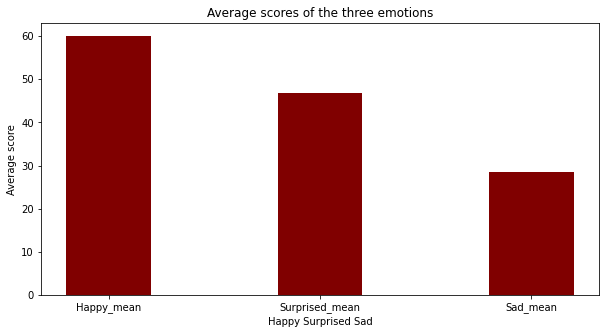

In [110]:
data = {'Happy_mean':df[df.happy_Y==1].happy.mean(), 'Surprised_mean':df[df.surprised_Y==1].surprised.mean(),'Sad_mean':df[df.sad_Y==1].sad.mean()}
name = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.bar(name, values, color ='maroon',
        width = 0.4)
 
plt.xlabel("Happy Surprised Sad")
plt.ylabel("Average score")
plt.title("Average scores of the three emotions")
plt.show()

The graph shows that the emotion happy has the highest average score while sad has the lowest average score which means that the Rekognition may recognize Happy the best among the three emotions.

### Step 3--Predict Amazon Rekognition's Emotion Reading Capability Changes with Facial Coverings

In this step, we set the variable as whether we are wearing the mask or the sunglasses, so we extract the score of each already assigned emotion from each picture.

We write the function to do the t-test for each emotion type. If we reject the null hypothesis, which means the Rekognition will represent a significant difference for that epecific facial expression, we can explore and compare them more. Otherwise, we say that the Rekognition is not able to detect this emotion from other, and thus rule out the type.

In [74]:
data8 = {'Origin':[99.912628,99.153297,98.858139,89.408730,3.892102,56.483967,34.607349,98.559067,54.349739,67.273697,98.888435,46.226345],
        'Mask':[2.884520,7.520224,0.063029,0.026170,0.527140,8.639049,99.071518,0.697983,34.322540,10.348138,2.147413,0.557873],
        'Sunglasses':[99.096512,95.768738,35.684280,92.019005,5.127502,27.369387,1.004770,5.309838,72.301300,10.642550,99.013817,65.528770]}
df10 = pd.DataFrame(data8)

In [75]:
df10

,Origin,Mask,Sunglasses
0,99.912628,2.884520,99.096512
1,99.153297,7.520224,95.768738
2,98.858139,0.063029,35.684280
3,89.408730,0.026170,92.019005
4,3.892102,0.527140,5.127502
5,56.483967,8.639049,27.369387
6,34.607349,99.071518,1.004770
7,98.559067,0.697983,5.309838
8,54.349739,34.322540,72.301300
9,67.273697,10.348138,10.642550


Then we do the regression to estimate our model and have the function below.

$Y_{mask} = \beta_0+\beta_1X_{origin}+u$

$Y_{glasses} = \beta_0+\beta_1X_{origin}+u$

In [91]:
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
result1=smf.ols(formula = 'Mask ~ Origin', data = data8).fit()
result1.summary()

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/scipy/stats/stats.py:1604: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  "anyway, n=%i" % int(n))


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   Mask   R-squared:                       0.156
Model:                            OLS   Adj. R-squared:                  0.072
Method:                 Least Squares   F-statistic:                     1.848
Date:                Mon, 22 Nov 2021   Prob (F-statistic):              0.204
Time:                        04:18:39   Log-Likelihood:                -55.681
No. Observations:                  12   AIC:                             115.4
Df Residuals:                      10   BIC:                             116.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     38.7782     19.944      1.944      0.080      -5.659      83.216
Origin        -0.3522      0.259     -1.359      0.204      -0.930       0.225
==============================================================================
Omnibus:                       16.147   Durbin-Watson:                   2.042
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               11.206
Skew:                           1.703   Prob(JB):                      0.00369
Kurtosis:                       6.287   Cond. No.                         194.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [89]:
result1.params

Intercept    38.778244
Origin       -0.352205
dtype: float64

Text(0, 0.5, 'Mask')

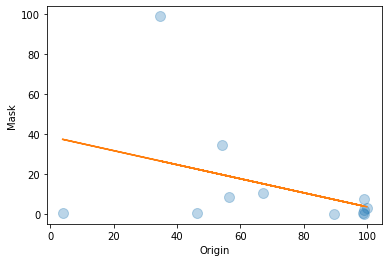

In [107]:
plt.plot(df10['Origin'], df10['Mask'], 'o', alpha=0.3, markersize=10)
plt.plot(df10['Origin'], result1.predict(df10['Origin']))
plt.xlabel("Origin")
plt.ylabel("Mask")

By taking a look at the coefficient, since -0.3522<0, we can make the conclusion that wearing the mask will make a significant difference about the output, and it will decreases the confidence score.

In [105]:
result2=smf.ols(formula = 'Sunglasses ~ Origin', data = data8).fit()
result2.summary()

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/scipy/stats/stats.py:1604: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  "anyway, n=%i" % int(n))


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Sunglasses   R-squared:                       0.295
Model:                            OLS   Adj. R-squared:                  0.224
Method:                 Least Squares   F-statistic:                     4.181
Date:                Mon, 22 Nov 2021   Prob (F-statistic):             0.0681
Time:                        04:25:28   Log-Likelihood:                -58.838
No. Observations:                  12   AIC:                             121.7
Df Residuals:                      10   BIC:                             122.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.0566     25.945      0.079      0.938     -55.753      59.866
Origin         0.6892      0.337      2.045      0.068      -0.062       1.440
==============================================================================
Omnibus:                        1.805   Durbin-Watson:                   2.286
Prob(Omnibus):                  0.406   Jarque-Bera (JB):                1.212
Skew:                          -0.556   Prob(JB):                        0.546
Kurtosis:                       1.912   Cond. No.                         194.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Text(0, 0.5, 'Sunglasses')

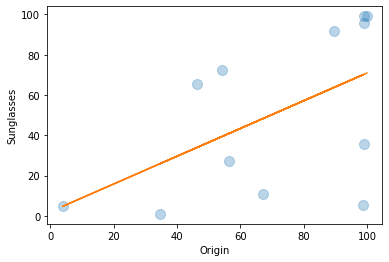

In [106]:
plt.plot(df10['Origin'], df10['Sunglasses'], 'o', alpha=0.3, markersize=10)
plt.plot(df10['Origin'], result2.predict(df10['Origin']))
plt.xlabel("Origin")
plt.ylabel("Sunglasses")

By taking a look at the coefficient, since 0.6892>0, we can make the conclusion that wearing the glasses will even increase the confidence score, which contracts our common sense, since people indeed will show emotions more efficiently without any covering on their faces.